In [2]:
import matplotlib.pylab as plt
import jax.numpy as jnp
import numpy as np
from desc.grid import Grid, LinearGrid
import desc.io
from desc.plotting import plot_3d, plot_surfaces, plot_comparison
import plotly.graph_objects as go


No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


DESC version 0+untagged.6462.g3ddbd9b.dirty,using JAX backend, jax version=0.4.14, jaxlib version=0.4.14, dtype=float64
Using device: CPU, with 0.84 GB available memory


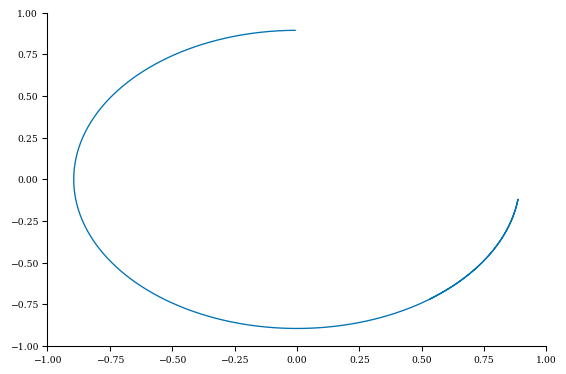

In [3]:
# Define the file name where the data is stored
file_name = f'tracing_optimized.txt'

# Initialize empty lists to store the separated columns
list1 = []
list2 = []

list3 = []
list4 = []

# Open the file for reading
with open(file_name, 'r') as file:
    # Read the first line (column headers) and discard it
    file.readline()

    # Read the data row by row
    i = 0
    for line in file:
        # Split the line into columns using tab as the delimiter
        columns = line.strip().split('\t')

        # Convert each column to the appropriate data type and append to the respective lists
        list1.append(float(columns[0]))
        list2.append(float(columns[1]))
        list3.append(float(columns[2]))
        list4.append(float(columns[3]))


plt.plot(np.sqrt(list1) * np.cos(list2), np.sqrt(list1) * np.sin(list2))

plt.xlim(-1, 1)
plt.ylim(-1, 1)
plt.show()
plt.close()


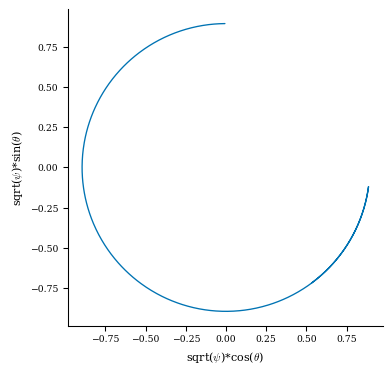

In [4]:
fig, ax = plt.subplots()

#create simple line plot

ax.plot(np.sqrt(list1) * np.cos(list2), np.sqrt(list1) * np.sin(list2))

#set aspect ratio to 1
ratio = 1.0
x_left, x_right = ax.get_xlim()
y_low, y_high = ax.get_ylim()
ax.set_aspect("equal", adjustable='box')

plt.xlabel(r'sqrt($\psi$)*cos($\theta$)')
plt.ylabel(r'sqrt($\psi$)*sin($\theta$)')

#plt.title(rf'E = {E_}, q/m = {q_}/{m_}, $\Delta$t = [{t_i}, {t_f}], nt = {nt_}, x$_i$ = [{psi_i:.2f}, {theta_i:.2f}, {zeta_i:.2f}], v$_\%$ = {vpar_i_ratio:.2f}')
plt.show()

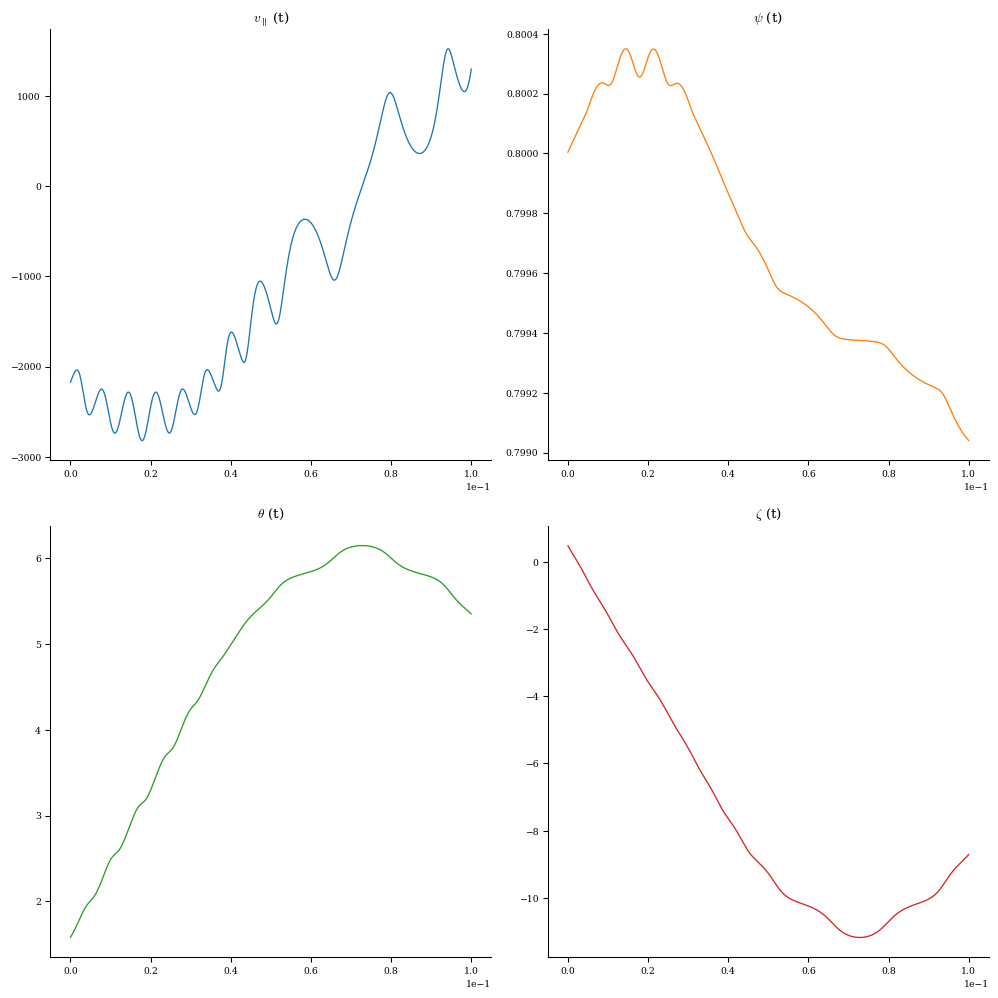

In [5]:
t = np.linspace(0, 0.1, 999)

fig, axs = plt.subplots(2, 2)
axs[0, 1].plot(t, list1, 'tab:orange')
axs[0, 1].set_title(r'$\psi$ (t)')
axs[1, 0].plot(t, list2, 'tab:green')
axs[1, 0].set_title(r'$\theta$ (t)')
axs[1, 1].plot(t, list3, 'tab:red')
axs[1, 1].set_title(r'$\zeta$ (t)')
axs[0, 0].plot(t, list4, 'tab:blue')
axs[0, 0].set_title(r"$v_{\parallel}$ (t)")

fig = plt.gcf()
fig.set_size_inches(10.5, 10.5)
axs[0, 0].ticklabel_format(axis="x", style="sci", scilimits=(0,0))
axs[1, 0].ticklabel_format(axis="x", style="sci", scilimits=(0,0))
axs[1, 1].ticklabel_format(axis="x", style="sci", scilimits=(0,0))
axs[0, 1].ticklabel_format(axis="x", style="sci", scilimits=(0,0))

In [6]:
eq = desc.io.load("optimized_rot_ellipse_M1_N1.h5")
eq._iota = eq.get_profile("iota").to_powerseries(order=eq.L, sym=True)
eq._current = None


In [7]:
grid = Grid(np.vstack((np.sqrt(list1), list2, list3)).T,sort=False)

data = eq.compute(["X", "Y", "Z"], grid)

In [8]:
print(data["X"])
print(data["Y"])
print(data["Z"])

[ 0.8987934   0.91160279  0.92389236  0.93564755  0.9468555   0.95750516
  0.96758752  0.97709576  0.98602532  0.99437397  1.00214184  1.00933138
  1.01594719  1.0219958   1.02748551  1.03242603  1.03682818  1.04070352
  1.04406407  1.04692192  1.04928896  1.05117662  1.05259568  1.05355603
  1.05406662  1.05413539  1.05376919  1.05297386  1.0517542   1.05011407
  1.04805647  1.04558353  1.04269666  1.03939662  1.03568351  1.03155685
  1.0270157   1.02205873  1.01668422  1.01089025  1.00467474  0.99803551
  0.99097051  0.98347782  0.97555572  0.96720267  0.95841754  0.94919951
  0.939548    0.9294629   0.91894448  0.90799345  0.89661106  0.88479916
  0.87256031  0.85989789  0.84681622  0.83332062  0.81941755  0.8051147
  0.79042095  0.77534641  0.75990235  0.74410118  0.72795625  0.71148165
  0.69469201  0.67760227  0.66022732  0.64258172  0.62467944  0.60653356
  0.58815592  0.56955689  0.55074529  0.53172812  0.51251048  0.4930955
  0.47348438  0.4536765   0.43366951  0.41345934  0.3

<Figure size 576x384 with 0 Axes>

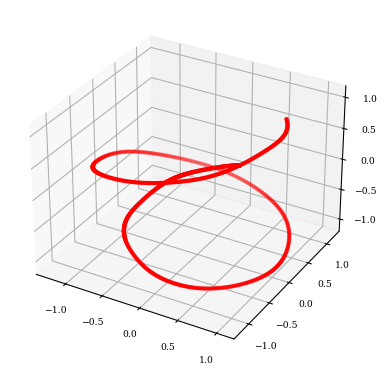

In [9]:
def plot_trajectory(data, ax=None, **kwargs):
    if ax is None:
        fig = plt.figure()
        ax = plt.figure().add_subplot(projection='3d')
    ax.scatter(data["X"], data["Y"], data["Z"], **kwargs)
    return ax

ax = plot_trajectory(data, color="r", marker=".")

In [10]:
grid = LinearGrid(rho=np.sqrt(0.8), M = 100, N = 100)
fig = plot_3d(eq, "B", alpha=0.3, grid=grid)
fig.add_trace(go.Scatter3d(x=data["X"], y=data["Y"], z=data["Z"], mode='markers', marker_size=2))
# fig.write_image("surface_and_tracing.png")


In [11]:
ar = eq.compute(["R0/a", "J"])
ar["R0/a"]

ar["J"]

Array([[ 4.67345346e-10, -1.59221671e+06,  4.08290327e+05],
       [-2.69756071e+04, -1.70915765e+06,  2.77077965e+05],
       [-5.54531463e+03, -1.87399632e+06,  9.11292556e+04],
       [ 5.54531463e+03, -1.87399632e+06,  9.11292556e+04],
       [ 2.69756071e+04, -1.70915765e+06,  2.77077965e+05],
       [ 1.78429240e-10, -1.22197291e+06,  8.48822296e+05],
       [-1.04121141e+05, -1.61705690e+06,  4.03184948e+05],
       [ 1.56810097e+04, -2.05058457e+06, -9.29292053e+04],
       [-1.56810097e+04, -2.05058457e+06, -9.29292053e+04],
       [ 1.04121141e+05, -1.61705690e+06,  4.03184948e+05],
       [ 1.18476419e-10, -8.01636778e+05,  1.37249813e+06],
       [-2.02997619e+05, -1.53234547e+06,  5.37138461e+05],
       [ 5.58177080e+04, -2.17547773e+06, -2.14062769e+05],
       [-5.58177080e+04, -2.17547773e+06, -2.14062769e+05],
       [ 2.02997619e+05, -1.53234547e+06,  5.37138461e+05],
       [ 4.75441069e+05, -1.62947907e+06,  2.46576435e+05],
       [ 4.18067363e+05, -1.64974705e+06